# Stochastic stranding
__Суммарное количество баллов: 8__

__Решение отправлять на `ml.course.practice@gmail.com`__

__Тема письма: `[ML][HW11] <ФИ>`, где вместо `<ФИ>` указаны фамилия и имя__

По бескрайним каменным джунглям от заказа к заказу бродят курьеры. Их задача - как можно быстрее доставить все заказы, чтобы взять новые. Ничто не может заставить их покинуть вечный цикл доставки.

In [18]:
import numpy as np
import pandas
import random
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from IPython.display import HTML
import matplotlib
import copy
from typing import List

In [27]:
def get_colors(distances, alpha=True):
    normed = np.array(distances) - np.min(distances)
    normed = normed / np.max(normed)
    alpha = 1/np.mean([len(row) for row in normed])**0.5 if alpha else 1.
    return [[((1. if n > 0.5 else 2 * n), (1. if n < 0.5 else 2 - 2*n), 0., alpha) 
             for n in row] for row in normed]

def get_coords(points):
    results = []
    for pts in points:
        x_prev, _ = pts[0]
        result = [pts[0]]
        for x, y in list(pts[1:]) + [pts[0]]:
            result.append((x_prev, y))
            result.append((x, y))
            x_prev = x
        results.append(list(zip(*result)))
    return results

def init_figure(X):
    upper_bound, lower_bound = X.max(axis=0) + 1, X.min(axis=0) - 1
    fig, ax = plt.subplots(figsize=(10, 10), nrows=1, ncols=1)
    #ax.set_facecolor((0.1, 0.1, 0.1))
    ax.grid(True)
    #ax.grid(True, color=(0.9, 0.9, 0.9))
    ax.set_xticks(range(lower_bound[0], upper_bound[0]))
    ax.set_yticks(range(lower_bound[1], upper_bound[1]))
    ax.set_xlim(lower_bound[0], upper_bound[0])
    ax.set_ylim(lower_bound[1], upper_bound[1])
    ax.set_xticklabels([])
    ax.set_yticklabels([])
    ax.scatter(X[:, 0], X[:, 1], color=(0, 0, 1))
    plt.tight_layout()
    return fig, ax    

def visualize_hillclimb(X, hillclimb):
    fig, ax = init_figure(X)
    permutations = hillclimb.optimize_explain(X)
    colors = get_colors([[cyclic_distance(X[p], hillclimb.dist) for p in permutations]], False)[0]
    coords = get_coords([X[p] for p in permutations])
    plot = ax.plot(coords[0][0], coords[0][1], color=colors[0])[0]
    
    def animate(i):
        plot.set_color(colors[i])
        plot.set_data(*coords[i])
        return (plot,)
    
    return animation.FuncAnimation(fig, animate, frames=len(permutations), interval=100, blit=True)

def visualize_genetic(X, genetic):
    fig, ax = init_figure(X)
    populations = genetic.optimize_explain(X)
    distances = [[cyclic_distance(X[p], genetic.dist) for p in populations[i]] for i in range(len(populations))]
    colors = get_colors(distances)
    coords = get_coords([X[p] for p in populations[0]])
    plots = [ax.plot(x, y, color=c)[0] for (x, y), c in zip(coords, colors[0])]
    best_id = np.argmin(distances[0])
    best_plot = ax.plot(*coords[best_id], color=(0.3, 0.3, 1, 0.9), linestyle="-.")[0]
    
    def animate(i):
        coords = get_coords([X[p] for p in populations[i]])
        for p, (x, y), c in zip(plots, coords, colors[i]):
            p.set_color(c)
            p.set_data(x, y)
        best_id = np.argmin(distances[i])
        best_plot.set_data(*coords[best_id])
        return plots + [best_plot]
    
    return animation.FuncAnimation(fig, animate, frames=len(populations), interval=100, blit=True)

In [3]:
def synthetic_points(count=25, dims=2):
    return np.random.randint(40, size=(count, dims))

X = synthetic_points()

### Задание 1 (1 балл)
Для начала научимся считать расстояния, которые курьерам придется преодолеть. Если бы они доставляли еду в пустыне, то им бы было достаточно считать евклидовы расстояния, т.к. можно просто идти напрямик. Однако курьеры доставляют еду только в городе, и двигаться могут только вдоль улиц. Поэтому нам понадобится манъэттенское расстояние.

#### Функции
`cyclic_distance(points, dist)` - возвращает суммарное расстояние пройденное курьером по циклу из точек `points` посчитанное при помощи функции `dist`.

`l2_distance(p1, p2)` - возвраает евклидово расстояние между точками.

`l1_distance(p1, p2)` - возвращает манхэттенское расстояние между точками.

In [12]:
def cyclic_distance(points, dist):
    res = 0
    for i in range(len(points) - 1):
        res += dist(points[i], points[i + 1])
    res += dist(points[0], points[-1])

    return res


def l2_distance(p1, p2):
    d = p1 - p2
    return np.sqrt(d @ d)


def l1_distance(p1, p2):
    return np.sum(np.abs(p1 - p2))

### Задание 2 (3 балла)
Курьер получил карту расположения заказов на карте. Ему хочется побыстрее обойти все точки. Для этого он хочет воспользоваться методом HillClimb, а вам предстоит ему в этом помочь. Реализуйте данный метод.

#### Методы
`optimize_explain(X)` - возвращает список из перестановок точек `X`, полученных в процессе оптимизации. Перестановка должна попадать в список после каждого изменения. Метод должен совершить не больше `max_iterations` итераций, на каждой из них необходимо рассмотреть все возможные пары индексов.

#### Параметры конструктора
`max_iterations` - максимальное количество итераций в методе `optimize_explain`

`dist` - функция расстояния

In [13]:
class HillClimb:
    def __init__(self, max_iterations, dist):
        self.max_iterations = max_iterations
        self.dist = dist  # Do not change

    def optimize(self, X):
        res = self.optimize_explain(X)
        return res[-1]

    def optimize_explain(self, X: np.ndarray):
        n = X.shape[0]
        perm = np.random.permutation(n)
        X = X[perm]
        dist_arr, curr_loss = self.calc_dist_array(X, self.dist)
        res = [perm]

        for _ in range(self.max_iterations):
            inds, new_loss, new_dist_arr = self.find_best_pair(X, dist_arr, curr_loss)

            if new_loss >= curr_loss:
                break

            curr_loss = new_loss

            new_perm = perm.copy()

            X[inds[0]:inds[1] + 1] = X[inds[1]:inds[0] - 1 if inds[0] > 0 else None:-1]
            new_perm[inds[0]:inds[1] + 1] = new_perm[inds[1]:inds[0] - 1 if inds[0] > 0 else None:-1]

            perm = new_perm
            dist_arr = new_dist_arr

            res.append(perm)

        return res

    def calc_dist_array(self, points, dist):
        res = []
        for i in range(len(points) - 1):
            res.append(dist(points[i], points[i + 1]))

        return res, np.sum(res)

    def find_best_pair(self, X: np.ndarray, dist_arr, curr_loss):
        """
        It changes the range, not just 2 points
        """
        n = X.shape[0]
        best_pair = (0, 0)
        best_loss = curr_loss
        best_dist_arr = dist_arr.copy()

        for i in range(n - 1):
            # don't wanna change adjacent points -> i + 2
            for j in range(i + 2, n):
                new_loss = curr_loss
                new_dist_arr = dist_arr.copy()

                if i > 0:
                    new_loss -= dist_arr[i - 1]
                    new_dist = self.dist(X[i - 1], X[j])

                    new_loss += new_dist
                    new_dist_arr[i - 1] = new_dist

                if j + 1 < n:
                    new_loss -= dist_arr[j]
                    new_dist = self.dist(X[i], X[j + 1])

                    new_loss += new_dist
                    new_dist_arr[j] = new_dist

                if new_loss < best_loss:
                    best_pair = (i, j)
                    best_loss = new_loss
                    best_dist_arr = new_dist_arr.copy()

        return best_pair, best_loss, best_dist_arr

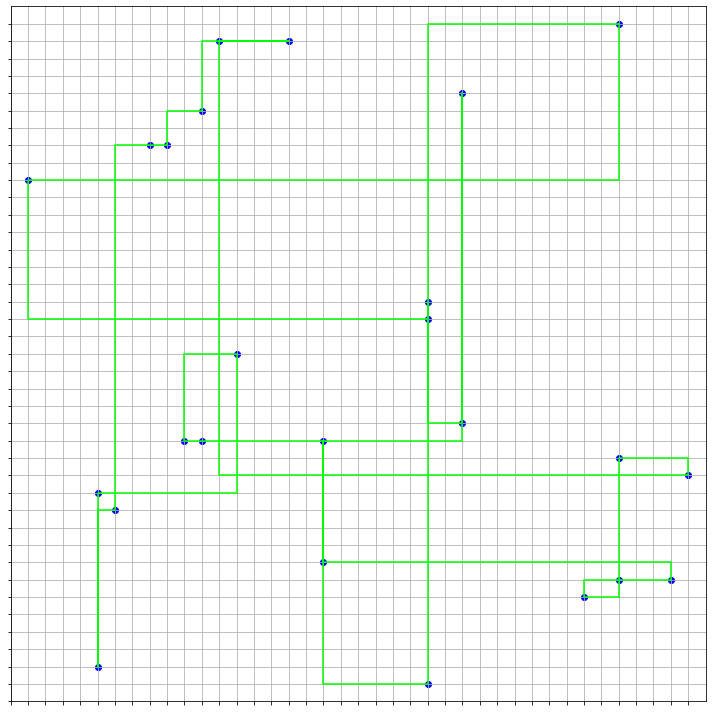

In [16]:
hc = HillClimb(100, l1_distance)
HTML(visualize_hillclimb(X, hc).to_jshtml())

### Задание 3 (4 балла)
Курьерское дело растет, теперь между городами блуждает большое количество курьеров, а их профессия вместе с известным маршрутом передается из поколение в поколение. Чем быстрее курьер способен обойти города - тем больше вероятность того, что он заработает себе на безоблачную старость и передаст свое дело потомкам. Симулируйте эволюцию курьеров, реализовав генетический алгоритм.

#### Методы
`optimize(X)` - выбирает лучшую перестановку из результатов `optimize_explain(X)`

`optimize_explain(X)` - возвращает список длины `iterations` популяций размера `population` перестановок точек `X`, полученных в процессе оптимизации. На каждом шаге алгоритм должен оставлять только `survivors` выживших, следующая популяция должна быть сгенерирована из них

In [28]:
class Genetic:
    def __init__(self, iterations, population, survivors, distance):
        self.pop_size = population
        self.surv_size = survivors
        self.dist = distance
        self.iters = iterations

    def optimize(self, X) -> np.ndarray:
        population = self.optimize_explain(X)
        return self.fitness(X, population)[0]

    def optimize_explain(self, X) -> np.ndarray:
        n = X.shape[0]
        population = np.array([np.random.permutation(n) for _ in range(self.pop_size)]).astype(int)
        res = [population]

        for _ in range(self.iters):
            pop_inds_sorted = self.fitness(X, population)

            # take the best
            pop_inds_survived = pop_inds_sorted[:self.surv_size]

            # generate new population
            population = self.crossover(population[pop_inds_survived])
            
            res.append(population)
            
        return res

    def fitness(self, X: np.ndarray, population: np.ndarray) -> np.ndarray:
        return np.argsort([cyclic_distance(X[perm], self.dist) for perm in population])

    def crossover(self, population: List[np.ndarray]) -> np.ndarray:
        n = len(population)
        res = []

        for _ in range(self.pop_size):
            inds = np.random.choice(n, 2, replace=True)
            res.append(self.breed(*population[inds]))

        return np.array(res, dtype=int)

    def breed(self, perm1, perm2) -> np.ndarray:
        n = len(perm1)
        copy_inds = np.sort(np.random.choice(n, 2, replace=True))

        part1 = perm1[copy_inds[0]:copy_inds[1] + 1]
        part2 = [ind for ind in perm2 if ind not in part1]

        res = np.concatenate([part1, part2])
        return res


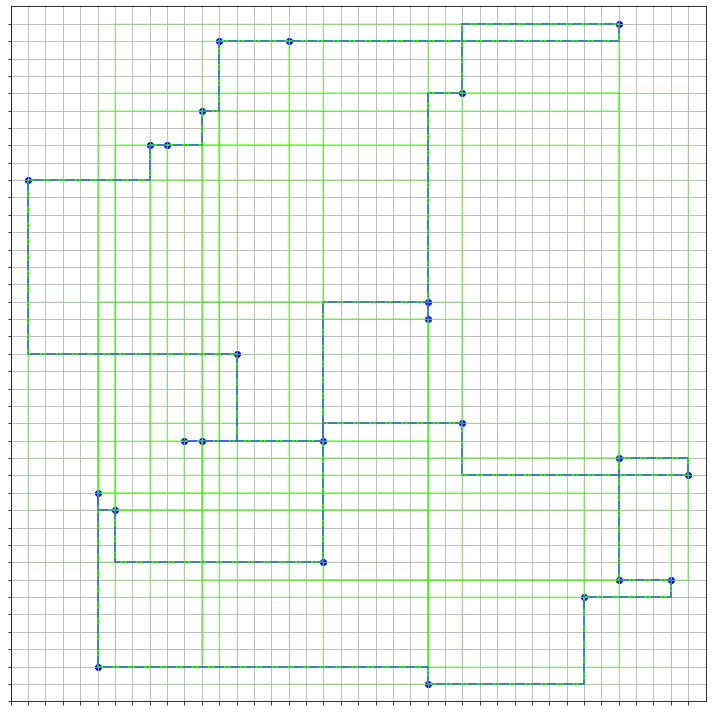

In [29]:
gen = Genetic(200, 100, 20, l1_distance)
HTML(visualize_genetic(X, gen).to_jshtml())